# TIME SERIES FORECASTING

# Import libraries

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn import preprocessing
import keras
import tensorflow as tf
from statsmodels.tsa.seasonal import seasonal_decompose


# Exploratory data analysis

In [13]:
df1 = pd.read_csv('/content/data1.csv')
df2 = pd.read_csv('/content/data2.csv')
df3 = pd.read_csv('/content/data3.csv')
data = pd.concat([df1, df2, df3], axis=0)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 62284 entries, 0 to 21049
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   c_produit  62284 non-null  int64 
 1   jour       62284 non-null  object
 2   total_cmd  62284 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.9+ MB


In [14]:
data.head()

,c_produit,jour,total_cmd
0,100140,2020-01-01,326
1,100140,2020-01-02,390
2,100140,2020-01-03,355
3,100140,2020-01-04,110
4,100140,2020-01-05,14


## Wrangle the Data


In [15]:
# Renaming the 'jour' column to 'date'
data.rename(columns={'jour': 'date'}, inplace=True)

# Converting the 'date' column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Sorting the DataFrame by the 'date' column in ascending order
data = data.sort_values('date', ascending=True)

# Creating a copy of the DataFrame for further analysis
df = data.copy()

# Setting the 'date' column as the index of the DataFrame
data.set_index('date', inplace=True)

# Creating a copy of the DataFrame for further analysis
data_product = data.copy()
# Dropping the 'c_produit' column from the DataFrame
data.drop(['c_produit'], axis=1, inplace=True)

# Displaying information about the DataFrame
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 62284 entries, 2020-01-01 to 2022-12-31
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   total_cmd  62284 non-null  int64
dtypes: int64(1)
memory usage: 973.2 KB


In [16]:
# Displaying the last few rows of the DataFrame
data.tail()

,total_cmd
date,
2022-12-31,2
2022-12-31,39
2022-12-31,21
2022-12-31,30
2022-12-31,25


## Visualization


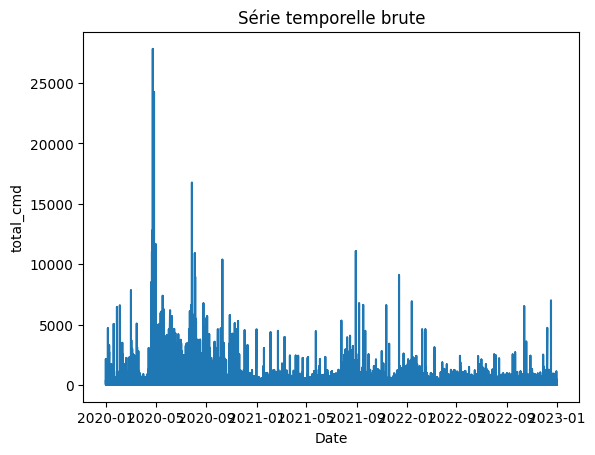

In [4]:
plt.plot( data)
plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Série temporelle brute')
plt.show()

# Cleanning the data

## Aggregation of data

In [17]:
# Resampling the time series data weekly
data_R = data.resample('w').median()

# Filling missing values with zeros
data_R = data_R.fillna(0)

# Displaying the last few rows of the resampled and filled DataFrame
data_R.tail()

,total_cmd
date,
2022-12-04,56.5
2022-12-11,68.0
2022-12-18,77.0
2022-12-25,73.0
2023-01-01,68.0


### Handle Outliers

<Axes: >

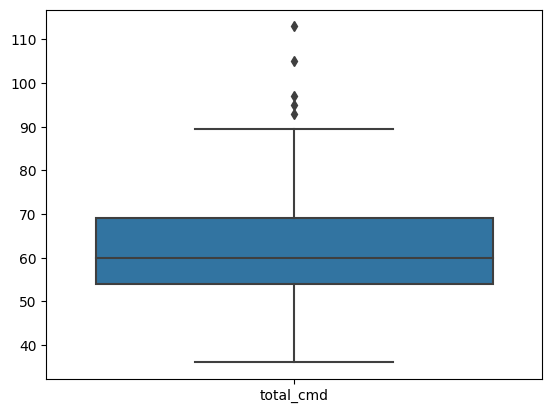

In [18]:
# Creating a copy of the resampled data for further analysis
data_W = data_R.copy()

# Creating a box plot to visualize the distribution of the data
sns.boxplot(data=data_W)

<Axes: >

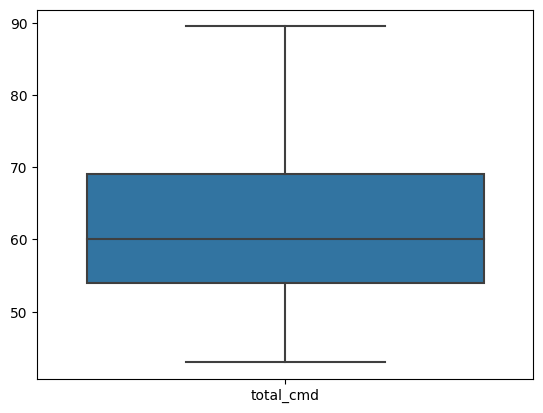

In [19]:
# Importing the winsorize function from the scipy.stats module
from scipy.stats import mstats

# Applying winsorization to the 'total_cmd' column with specified limits
# This limits extreme values by replacing them with values within the limits
data_W['total_cmd'] = mstats.winsorize(data_W['total_cmd'], limits=[0.032, 0.032])

# Creating a box plot to visualize the distribution of the winsorized data
sns.boxplot(data=data_W)


In [ ]:
# Checking for missing values in the 'data_W' DataFrame
missing_values_count = data_W.isna().sum()

total_cmd    0
dtype: int64

# Analysing and visualizing the data

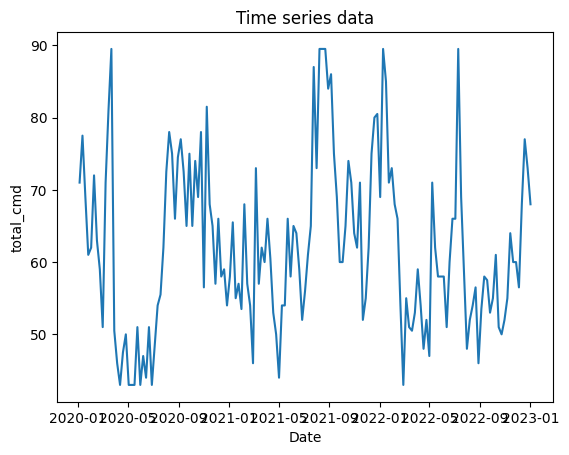

In [22]:
plt.plot( data_W)
plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Time series data')
plt.show()

## The monthly average





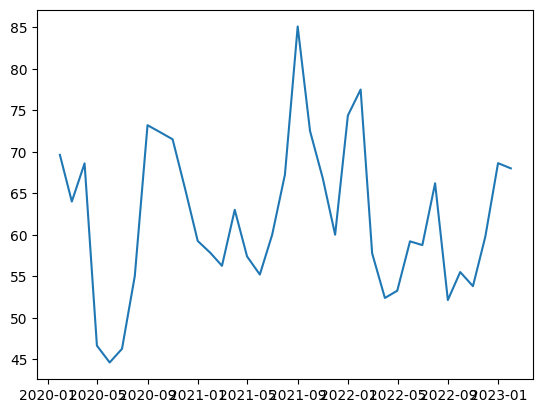

In [ ]:
# Resampling the 'total_cmd' column to calculate monthly means
monthly_mean = data_W['total_cmd'].resample('M').mean()

# Creating a line plot to visualize the monthly mean values
plt.plot(monthly_mean)

## The annual average

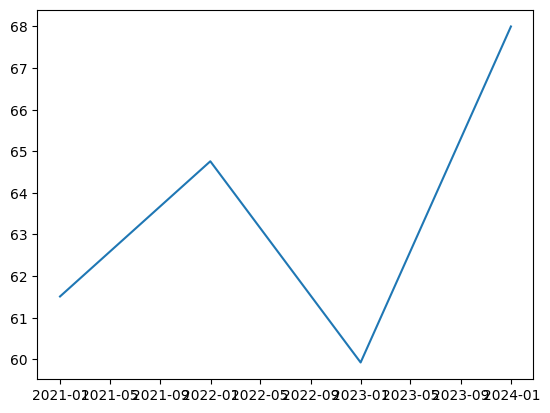

In [ ]:
# Resampling the 'total_cmd' column to calculate yearly means
yearly_mean = data_W['total_cmd'].resample('Y').mean()

# Creating a line plot to visualize the yearly mean values
plt.plot(yearly_mean)

## Decomposition of the data

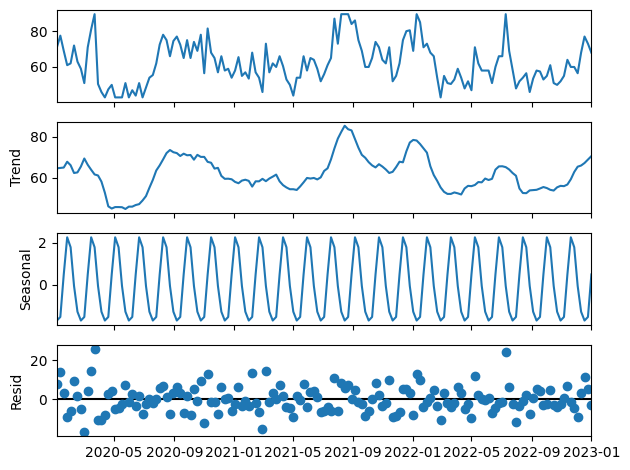

In [ ]:
# Importing the statsmodels library
import statsmodels.api as sm

# Performing seasonal decomposition of the 'data_W' time series
# The 'additive' model is used to decompose the time series
# 'extrapolate_trend' is set to 'freq' for trend extrapolation
# 'period' is set to 7 for a weekly seasonal pattern
decomposition = sm.tsa.seasonal_decompose(data_W, model='additive', extrapolate_trend='freq', period=7)

# Plotting the decomposed components including observed, trend, seasonal, and residual
decomposition.plot();

As you can see in the graphic above, the time series definitely displays seasonality

## Type of trend

In [81]:
!pip install pymannkendall


In [9]:
# Importing the pymannkendall library
import pymannkendall as mk

# Performing the seasonal Mann-Kendall test on the 'data_W' time series
# with a seasonal period of 7 days
seasonal_test_result = mk.seasonal_test(data_W, period=7)

# Printing the result of the seasonal Mann-Kendall test
print(seasonal_test_result)


Seasonal_Mann_Kendall_Test(trend='no trend', h=False, p=0.5967153276318211, z=-0.5291299192775852, Tau=-0.030897207367795602, s=-52.0, var_s=9290.000000000002, slope=-0.05, intercept=60.55714285714286)


## Check for stationarity of time series

In [ ]:
# Importing the adfuller function from the statsmodels library
from statsmodels.tsa.stattools import adfuller

# Performing the Augmented Dickey-Fuller (ADF) test on the 'data_W' time series
adf_test = adfuller(data_W)

# Printing the ADF statistic and p-value
print('ADF Statistics: {}'.format(adf_test[0]))
print('p-value: {}'.format(adf_test[1]))

# Printing critical values for different significance levels
for key, value in adf_test[4].items():
    print('Critical Values Over {}: {}'.format(key, value))

ADF Statistics: -3.6459388856707005
p-value: 0.004941127858383528
Critical Values Over 1%: -3.4756368462466662
Critical Values Over 5%: -2.8814104466172608
Critical Values Over 10%: -2.5773652982553568


the ADF test result indicates that the time series is stationary, which is a desirable property for time series analysis and modeling.

## Autocorrelation and Partial Autocorrelation Analysis

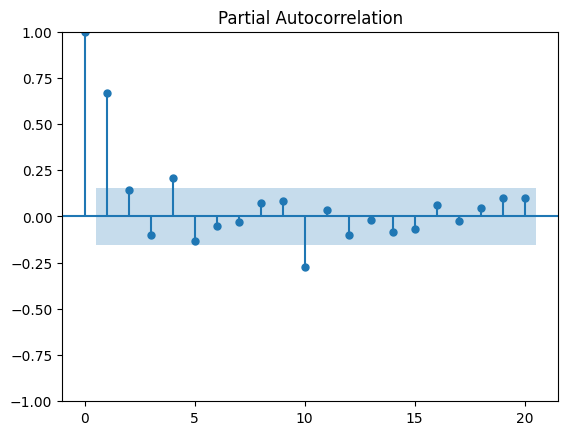

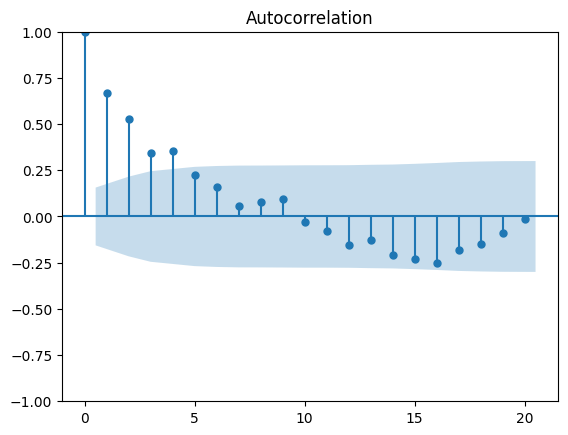

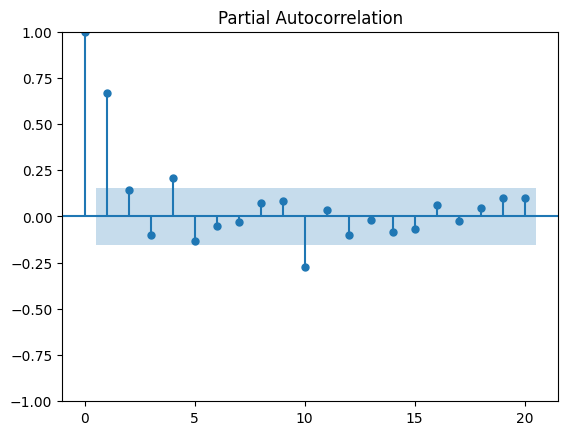

In [ ]:
# Importing necessary functions for autocorrelation and partial autocorrelation plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plotting the autocorrelation function (ACF) of the 'total_cmd' time series
# with 'lags' parameter set to 20 to specify the number of lags to show
plot_acf(data_W['total_cmd'], lags=20)

# Plotting the partial autocorrelation function (PACF) of the 'total_cmd' time series
# with 'lags' parameter set to 20 to specify the number of lags to show
plot_pacf(data_W['total_cmd'], lags=20)


By observing the ACF and PACF plots, we will use them to indicate the potential values for the autoregressive order (p) and moving average order (q) components of the ARIMA model."

## Visualization of the different products

<Figure size 1000x600 with 0 Axes>

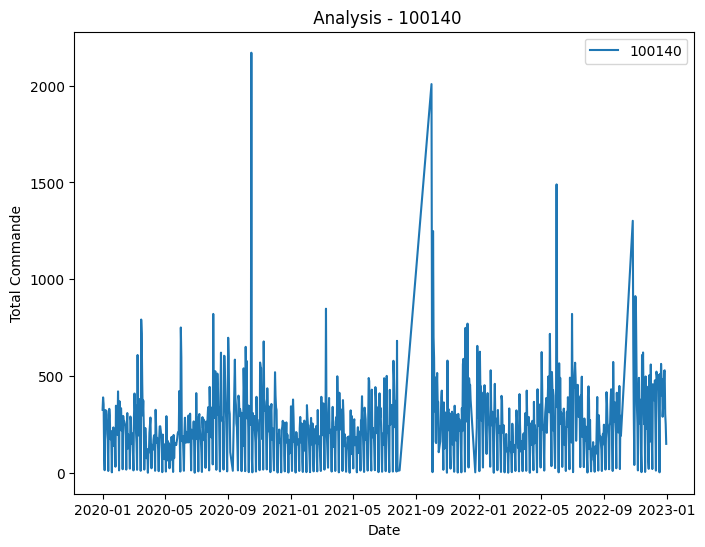

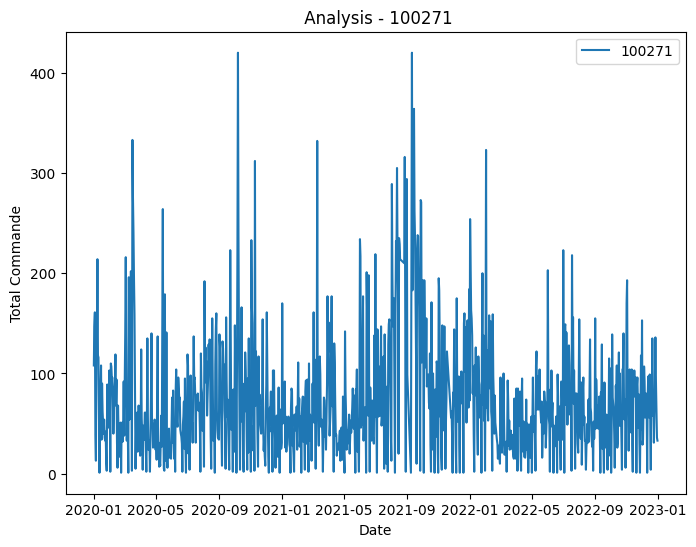

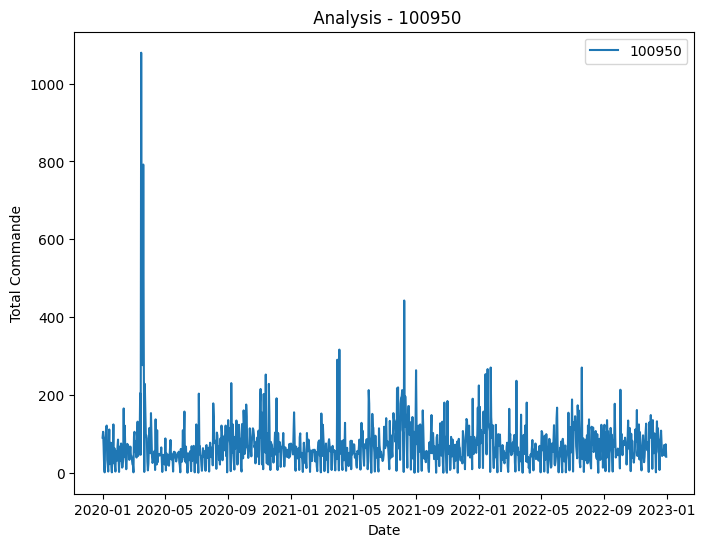

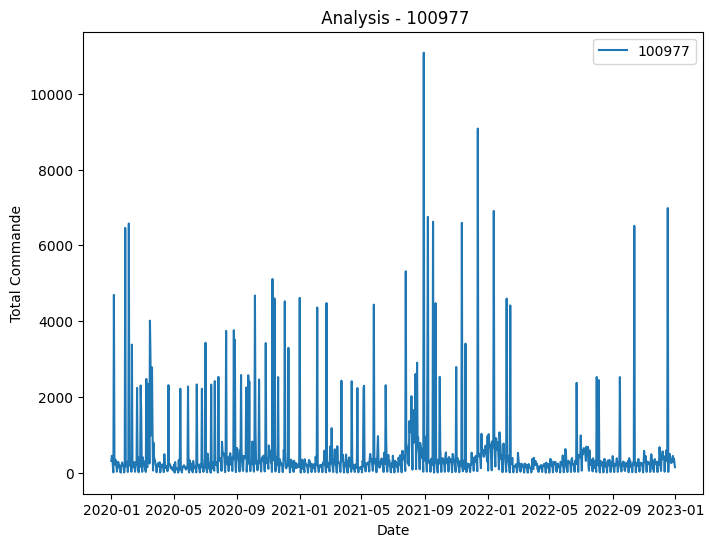

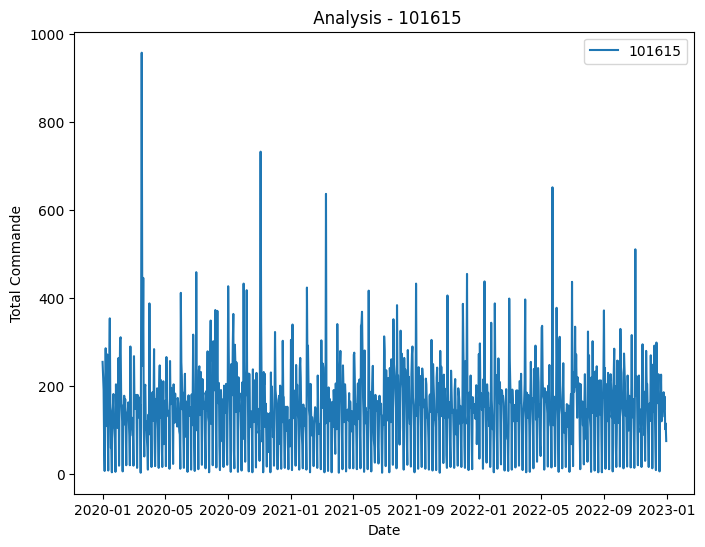

...

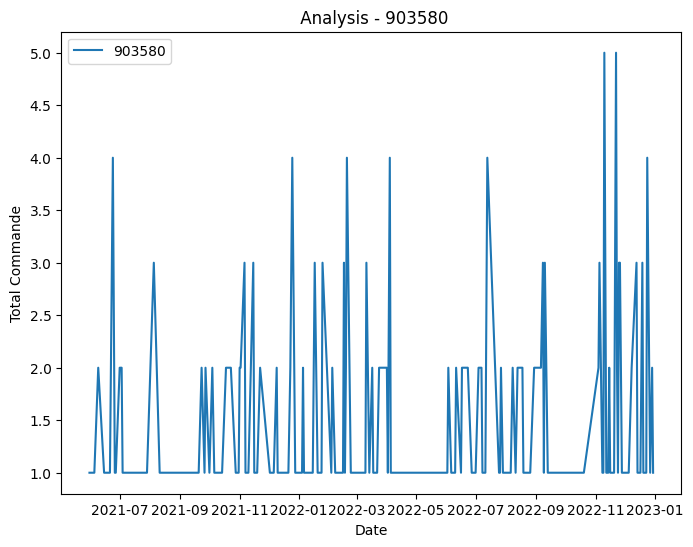

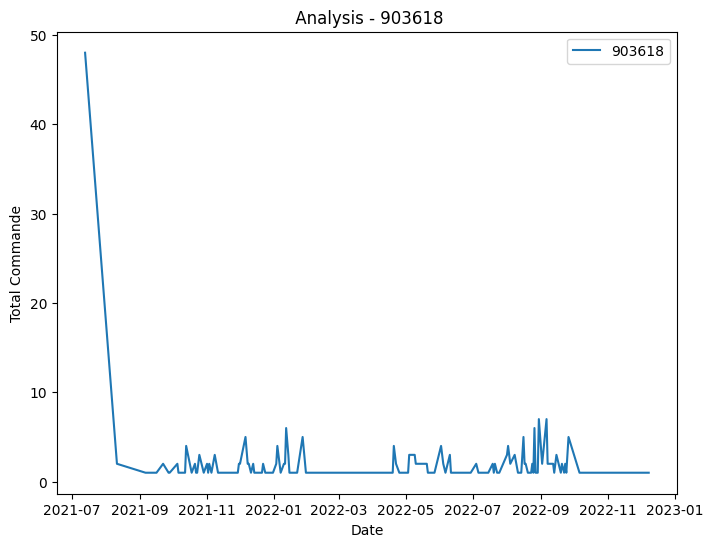

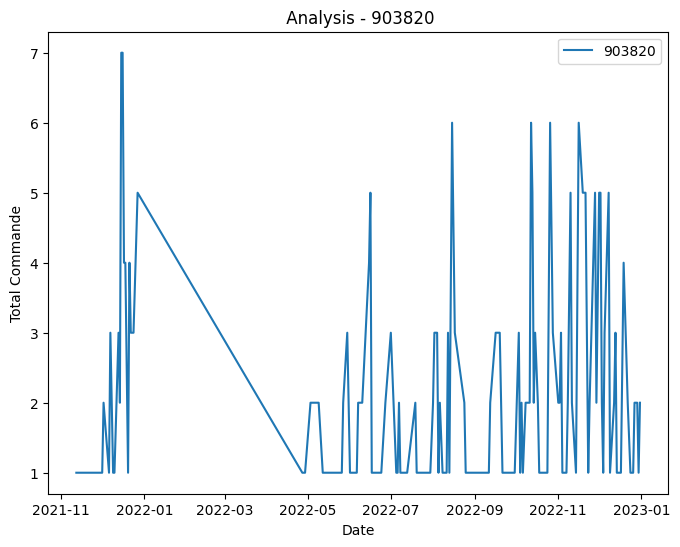

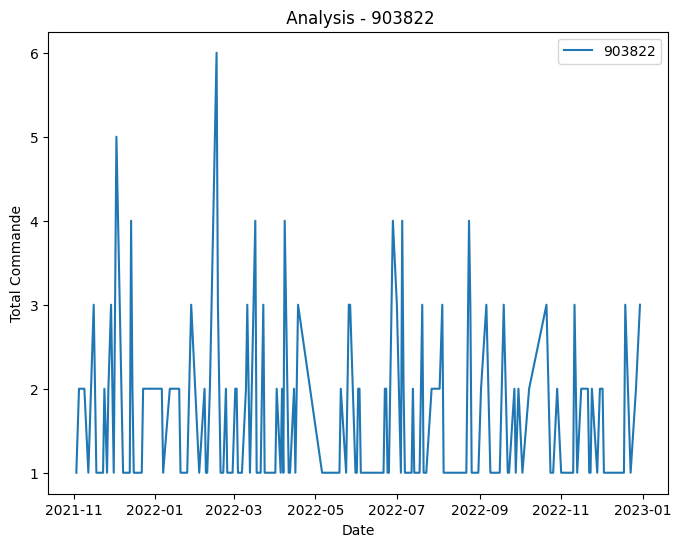

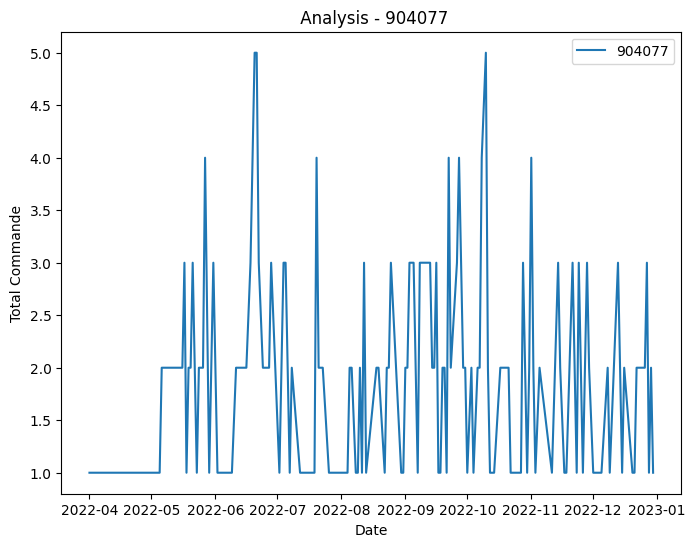

In [4]:
plt.figure(figsize=(10, 6))
grouped_df = data_product.groupby('c_produit')
for product, data in grouped_df:
    plt.figure(figsize=(8, 6))
    plt.plot( data['total_cmd'], label=product)
    plt.xlabel('Date')
    plt.ylabel('Total Commande')
    plt.title(f' Analysis - {product}')
    plt.legend()
    plt.show()
    print()


## Moving averege

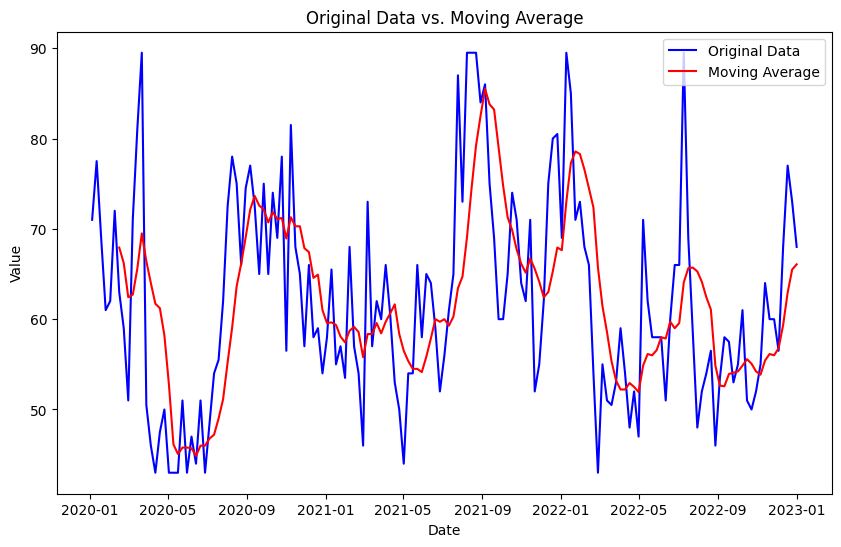

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a pandas Series named 'data'
# and you have calculated the moving average with a specified window size
window_size = 7  # Adjust the window size as needed
rolling_mean = data_W.rolling(window=window_size).mean()

# Plot the original data and the moving average
plt.figure(figsize=(10, 6))
plt.plot(data_W, label='Original Data', color='blue')
plt.plot(rolling_mean, label='Moving Average', color='red')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Original Data vs. Moving Average')
plt.legend()
plt.show()


# Models

Now that we’ve performed some initial data exploration, let’s build and tune some models to forecast the time series.

## Making data train & test


In [20]:
from sklearn.model_selection import train_test_split
train_data, test_data = train_test_split(data_W, test_size=0.2, shuffle=False)

## Building the SARIMA Model


### Grid search

We select the p, d, q, P, D, and Q hyperparameters that best fit the SARIMA model largely through brute force–we sample different model hyperparameter variations until we find the best model combination. After generating each model, we use its AIC and BIC scores to gauge its performance. The AIC, or the Akaike information criterion, is a metric that compares the quality of a set of statistic models against one another. When comparing models using AIC metrics, we take the model with the lowest AIC score as the best option.

In the code snippet below, we generate different hyperparameter variations to run through the SARIMA model, and return a list to loop through:

In [ ]:
import itertools
import warnings
warnings.filterwarnings('ignore')
# Grid Search
p = d = q = range(0,3) # p, d, and q can be either 0, 1, or 2
pdq = list(itertools.product(p,d,q)) # gets all possible combinations of p, d, and q
p2 = d2 = q2 = range(0, 2) # second set of p's, d's, and q's for seasonal parameters
pdq2 = list(itertools.product(p2,d2,q2)) # similar to code above but for seasonal parameters
s = 12 # here I use twelve but the number here is representative of the periodicity of the seasonal cycle
pdqs2 = [(c[0], c[1], c[2], s) for c in pdq2]
combs = {}
aics = []
# Grid Search Continued
for combination in pdq:
    for seasonal_combination in pdqs2:
        try:
            model = sm.tsa.statespace.SARIMAX(train_data, order=combination, seasonal_order=seasonal_combination,
                                             enforce_stationarity=True,
                                             enforce_invertibility=True)
            model = model.fit(disp=False)
            combs.update({model.aic : [combination, seasonal_combination]})
            aics.append(model.aic)

        except:
            continue

best_aic = min(aics)
print('best aic is: ', round(best_aic, 3))
print(40*'==')
print ('ARIMA parameters: ', '\n', 'AR: ', combs[best_aic][0][0], '\n', 'I: ',combs[best_aic][0][1], '\n', 'MA: ',combs[best_aic][0][2])
print('Seasonal parameters:', combs[best_aic][1])

best aic is:  847.359
ARIMA parameters:  
 AR:  2 
 I:  0 
 MA:  1
Seasonal parameters: (0, 1, 1, 12)


### SARIMA Model

In [104]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model = sm.tsa.statespace.SARIMAX(train_data,
                                order=(2, 0, 1),
                                seasonal_order=(0,1,1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
result_Sarima = model.fit()
pred_Sarima=result_Sarima.predict(start=test_data.index[0],end=test_data.index[-1])

### INTERPRETING THE MODEL RESULTS

In [32]:
result_Sarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          total_cmd   No. Observations:                  125
Model:             SARIMAX(2, 0, 1)x(0, 1, 1, 12)   Log Likelihood                -360.324
Date:                            Thu, 31 Aug 2023   AIC                            730.648
Time:                                    14:25:04   BIC                            743.623
Sample:                                01-05-2020   HQIC                           735.898
                                     - 05-22-2022                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0128      0.171     -0.075      0.940      -0.347       0.322
ar.L2          0.6117      0.124      4.920      0.000       0.368       0.855
ma.L1          0.5800      0.217      2.675      0.007       0.155       1.005
ma.S.L12      -0.8750      0.207     -4.220      0.000      -1.281      -0.469
sigma2        76.8423     14.450      5.318      0.000      48.520     105.165
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 2.77
Prob(Q):                              0.86   Prob(JB):                         0.25
Heteroskedasticity (H):               1.07   Skew:                             0.41
Prob(H) (two-sided):                  0.84   Kurtosis:                         2.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Visualization


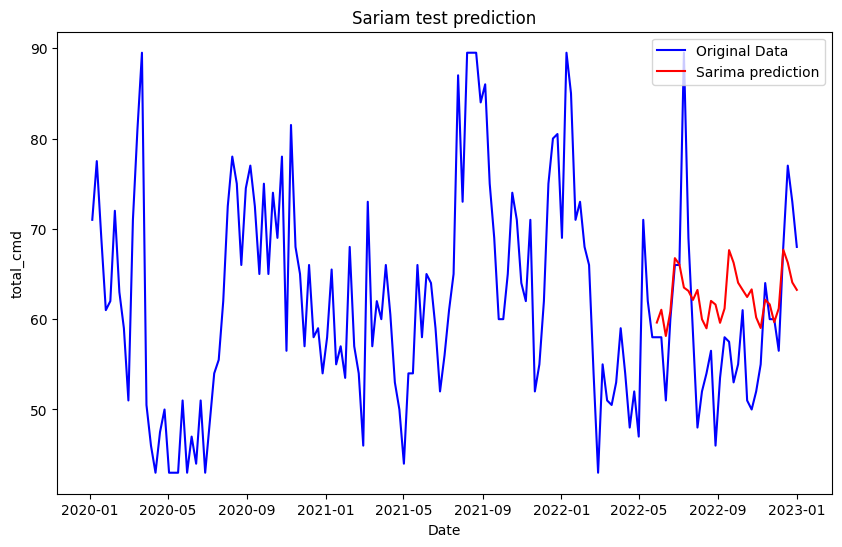

In [17]:
plt.figure(figsize=(10, 6))
sns.lineplot( data_W['total_cmd'], label='Original Data', color='blue')
sns.lineplot(pred_Sarima, label='Sarima prediction', color='red')
plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Sariam test prediction')
plt.legend(loc='upper right')
plt.show()

### Mean Squared Error

In [105]:
from sklearn.metrics import mean_squared_error
MSE_SARIMA= mean_squared_error(test_data['total_cmd'], pred_Sarima)
print('Mean Squared Error:', MSE_SARIMA)

Mean Squared Error: 76.03954264815714


## Building the ARIMA Model


In [102]:
import statsmodels.api as sm
model = sm.tsa.arima.ARIMA(train_data, order=(10,0,4))
result_Arima = model.fit()
pred_ARIMA=result_Arima.predict(start=test_data.index[0],end=test_data.index[-1])


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


### INTERPRETING THE MODEL RESULTS

In [43]:
result_Arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              total_cmd   No. Observations:                  125
Model:                ARIMA(10, 0, 4)   Log Likelihood                -433.688
Date:                Wed, 30 Aug 2023   AIC                            899.376
Time:                        23:31:25   BIC                            944.629
Sample:                    01-05-2020   HQIC                           917.760
                         - 05-22-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         62.7780      2.130     29.478      0.000      58.604      66.952
ar.L1          0.6721      0.165      4.080      0.000       0.349       0.995
ar.L2          1.0881      0.235      4.627      0.000       0.627       1.549
ar.L3         -0.8438      0.194     -4.360      0.000      -1.223      -0.465
ar.L4         -0.4581      0.294     -1.556      0.120      -1.035       0.119
ar.L5          0.4264      0.232      1.835      0.067      -0.029       0.882
ar.L6         -0.2505      0.228     -1.098      0.272      -0.698       0.197
ar.L7         -0.0379      0.219     -0.173      0.863      -0.468       0.392
ar.L8          0.3615      0.182      1.989      0.047       0.005       0.718
ar.L9          0.0708      0.178      0.397      0.691      -0.279       0.420
ar.L10        -0.2804      0.113     -2.486      0.013      -0.501      -0.059
ma.L1         -0.0682      0.156     -0.438      0.662      -0.374       0.237
ma.L2         -1.0542      0.155     -6.817      0.000      -1.357      -0.751
ma.L3          0.0674      0.127      0.529      0.597      -0.182       0.317
ma.L4          0.7977      0.145      5.486      0.000       0.513       1.083
sigma2        57.9629      8.538      6.789      0.000      41.228      74.697
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                 2.56
Prob(Q):                              0.81   Prob(JB):                         0.28
Heteroskedasticity (H):               1.21   Skew:                             0.31
Prob(H) (two-sided):                  0.54   Kurtosis:                         3.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Visualization


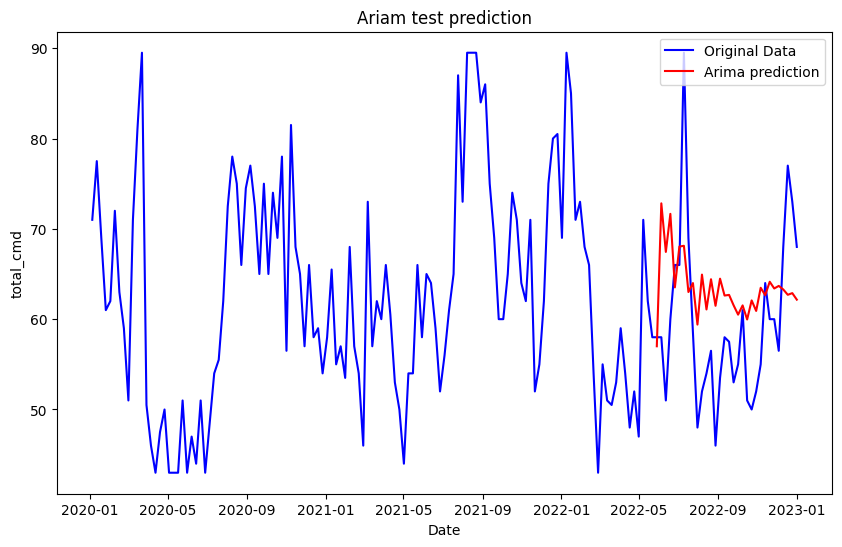

In [28]:
plt.figure(figsize=(10, 6))

sns.lineplot( data_W['total_cmd'], label='Original Data', color='blue')
sns.lineplot(pred_ARIMA, label='Arima prediction', color='red')

plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Ariam test prediction')
plt.legend(loc='upper right')
plt.show()

### MSE

In [103]:
from sklearn.metrics import mean_squared_error
MSE_ARIMA = mean_squared_error(test_data['total_cmd'], pred_ARIMA)
MSE['MSE_ARIMA']=MSE_ARIMA
print('Mean Squared Error:', MSE_ARIMA)

Mean Squared Error: 90.79782812794016


## Prediction for the next 4 weeks with the SARIMA and ARIMA models

### Prediction with SARIMA model

In [142]:
import pandas as pd

#Sarima model
model = sm.tsa.statespace.SARIMAX(data_W,
                                order=(2, 0, 1),
                                seasonal_order=(0,1,1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False,
                                  trend='n')

result_Sarima = model.fit()

# Generate date range for prediction
data_pred = pd.DataFrame(pd.date_range(start='2023-01-01', end='2023-01-30', freq='w'),columns=['date'] )
data_pred['date']= pd.to_datetime(data_pred['date'])
data_pred.set_index('date', inplace=True)

# Make predictions on the data_pred using the trained model
data_pred['predi_SARIMA'] = result_Sarima.predict(start=data_pred.index[0], end=data_pred.index[-1])

# Display the last few rows of the data_pred DataFrame
print(data_pred)


            predi_SARIMA
date                    
2023-01-01     69.271826
2023-01-08     64.131691
2023-01-15     62.944071
2023-01-22     60.315400
2023-01-29     60.221633


### Prediction with ARIMA model

In [143]:
import pandas as pd

#Arima model
import statsmodels.api as sm
model = sm.tsa.arima.ARIMA(data_W, order=(10,0,4))
result_Arima = model.fit()

# Make predictions on the data_pred using the trained model
data_pred['predict_ARIMA'] = result_Arima.predict(start=data_pred.index[0], end=data_pred.index[-1])

# Display the rows of the data_pred DataFrame
print(data_pred)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


            predi_SARIMA  predict_ARIMA
date                                   
2023-01-01     69.271826      68.171539
2023-01-08     64.131691      69.616274
2023-01-15     62.944071      68.356535
2023-01-22     60.315400      64.512785
2023-01-29     60.221633      63.298318


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


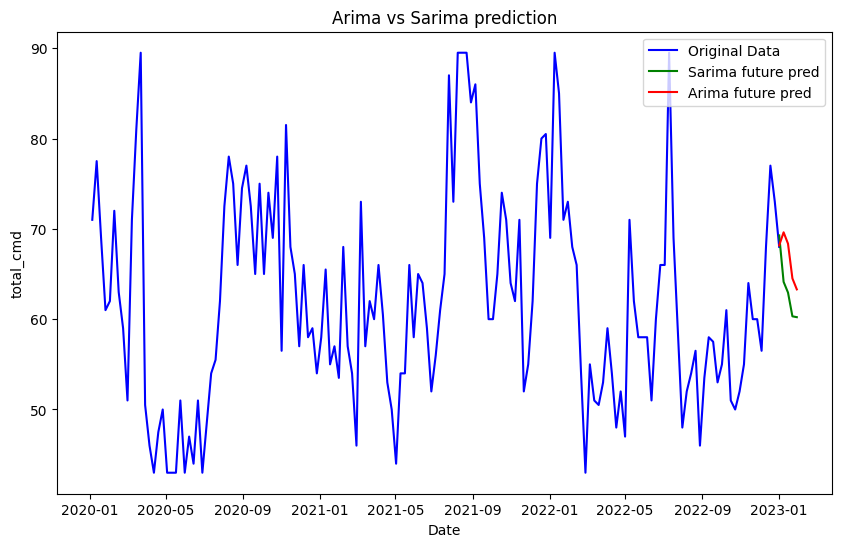

In [ ]:
plt.figure(figsize=(10, 6))

sns.lineplot( data_W['total_cmd'], label='Original Data', color='blue')
sns.lineplot(data_pred['predi_SARIMA'],color='green',label='Sarima future pred')
sns.lineplot(data_pred['predict_ARIMA'],color='red',label='Arima future pred')

plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Arima vs Sarima prediction')
plt.legend(loc='upper right')
plt.show()

## Building the PROPHET Model


### Install prophet library

In [35]:
%pip install prophet

### Change Column Names for Prophet

In [36]:
data_Prp=data_W.copy()
data_Prp.reset_index('date', inplace=True)
data_Prp = data_Prp.rename(columns={'date': 'ds','total_cmd': 'y'})
data_Prp.head()

,ds,y
0,2020-01-05,71.0
1,2020-01-12,77.5
2,2020-01-19,69.0
3,2020-01-26,61.0
4,2020-02-02,62.0


### Making data train & test


In [37]:
from sklearn.model_selection import train_test_split
trainP_data, testP_data = train_test_split(data_Prp, test_size=0.2, shuffle=False)

### DataFrame of Moroccan holidays

In [38]:
import pandas as pd
import holidays

# Create an empty DataFrame to store the holidays
holiday = pd.DataFrame([])

# Retrieve Moroccan holidays for the specified years (2018, 2019, 2020)
for date, name in sorted(holidays.Morocco(years=[2020, 2021, 2022,2023]).items()):
    # Append each holiday to the DataFrame
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': name}, index=[0]), ignore_index=True)

# Convert the 'ds' column to datetime format
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')

# Display the resulting DataFrame with Moroccan holidays
holiday.tail(10)

<ipython-input-38-18c97963d587>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': name}, index=[0]), ignore_index=True)
<ipython-input-38-18c97963d587>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': name}, index=[0]), ignore_index=True)
<ipython-input-38-18c97963d587>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': name}, index=[0]), ignore_index=True)
<ipython-input-38-18c97963d587>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  holiday = holida

,ds,holiday
52,2023-06-29,Eid al-Adha* (*estimated)
53,2023-07-19,Islamic New Year* (*estimated)
54,2023-07-30,Throne Day
55,2023-08-14,Oued Ed-Dahab Day
56,2023-08-20,Revolution Day
57,2023-08-21,Youth Day
58,2023-09-27,Prophet's Birthday* (*estimated)
59,2023-09-28,Prophet's Birthday* (*estimated)
60,2023-11-06,Green March
61,2023-11-18,Independence Day


## grid search

In [ ]:
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import mean_absolute_percentage_error
import random
from prophet import Prophet

params_grid = {
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'n_changepoints' : [25,50,75]}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         holidays=holiday,
                         interval_width=0.95)
    train_model.add_country_holidays(country_name='MA')
    train_model.fit(trainP_data)
    pred_Prophet = train_model.predict(testP_data)
    MAPE = mean_absolute_percentage_error(testP_data['y'],abs(pred_Prophet['yhat']))
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/srlh7aui.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/mvvpnclq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61671', 'data', 'file=/tmp/tmpkrx9m9ip/srlh7aui.json', 'init=/tmp/tmpkrx9m9ip/mvvpnclq.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modellr2n5j0r/prophet_model-20230824113358.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:33:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:33:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28017340985388556
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/p2qxc3x5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/3xoqsj12.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11045', 'data', 'file=/tmp/tmpkrx9m9ip/p2qxc3x5.json', 'init=/tmp/tmpkrx9m9ip/3xoqsj12.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelj8y6497h/prophet_model-20230824113359.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:33:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:33:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28019720578448226
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/946nsrgn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/faz8egc2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43192', 'data', 'file=/tmp/tmpkrx9m9ip/946nsrgn.json', 'init=/tmp/tmpkrx9m9ip/faz8egc2.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modely7l7wn_e/prophet_model-20230824113400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.280463113053067
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/qwwftcer.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/_dv7m97y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38693', 'data', 'file=/tmp/tmpkrx9m9ip/qwwftcer.json', 'init=/tmp/tmpkrx9m9ip/_dv7m97y.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model5b5rhx7z/prophet_model-20230824113402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28031443775589154
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/rnv3bfqm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/4e2r7a2j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64717', 'data', 'file=/tmp/tmpkrx9m9ip/rnv3bfqm.json', 'init=/tmp/tmpkrx9m9ip/4e2r7a2j.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model4q4oy5bd/prophet_model-20230824113403.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28054442837808147
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/vuuqbi8k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/vtc4m8bn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8750', 'data', 'file=/tmp/tmpkrx9m9ip/vuuqbi8k.json', 'init=/tmp/tmpkrx9m9ip/vtc4m8bn.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelnh3x0s5o/prophet_model-20230824113404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2810713706473541
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/4m3d6d4t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/58gd7vxg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87180', 'data', 'file=/tmp/tmpkrx9m9ip/4m3d6d4t.json', 'init=/tmp/tmpkrx9m9ip/58gd7vxg.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modeleg6hzme3/prophet_model-20230824113404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2803559113262452
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/g7xby_re.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/hwewubgj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3302', 'data', 'file=/tmp/tmpkrx9m9ip/g7xby_re.json', 'init=/tmp/tmpkrx9m9ip/hwewubgj.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model7cnqt86x/prophet_model-20230824113405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2804044835034758
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/c7au0acr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/s47c9_i1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51262', 'data', 'file=/tmp/tmpkrx9m9ip/c7au0acr.json', 'init=/tmp/tmpkrx9m9ip/s47c9_i1.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelqgj4lyzy/prophet_model-20230824113406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28137014249179376
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/_pnhgap9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/zc1iiry6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24318', 'data', 'file=/tmp/tmpkrx9m9ip/_pnhgap9.json', 'init=/tmp/tmpkrx9m9ip/zc1iiry6.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model_ia_bd6l/prophet_model-20230824113406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28007563120933876
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/un924z_0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/lzmufxis.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53243', 'data', 'file=/tmp/tmpkrx9m9ip/un924z_0.json', 'init=/tmp/tmpkrx9m9ip/lzmufxis.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelfl4_o1ks/prophet_model-20230824113407.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.281026633817596
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 75}
Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2810921753224982
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/9741f5xj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/rvfrhe43.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81001', 'data', 'file=/tmp/tmpkrx9m9ip/9741f5xj.json', 'init=/tmp/tmpkrx9m9ip/rvfrhe43.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelkxs7ze82/prophet_model-20230824113408.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.28023270259552396
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/sw6e0x8a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/x_me6jck.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77306', 'data', 'file=/tmp/tmpkrx9m9ip/sw6e0x8a.json', 'init=/tmp/tmpkrx9m9ip/x_me6jck.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelrscyjh9a/prophet_model-20230824113409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2812147553166339
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/z3e509sd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/y7k3gsvn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92650', 'data', 'file=/tmp/tmpkrx9m9ip/z3e509sd.json', 'init=/tmp/tmpkrx9m9ip/y7k3gsvn.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelo5hhn49c/prophet_model-20230824113410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2809711990798567
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/ytucg4rl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/wu_1cj_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74613', 'data', 'file=/tmp/tmpkrx9m9ip/ytucg4rl.json', 'init=/tmp/tmpkrx9m9ip/wu_1cj_k.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelzu0whjrq/prophet_model-20230824113411.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2686707977298812
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/5jdg5a4e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/pzfdsge1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1254', 'data', 'file=/tmp/tmpkrx9m9ip/5jdg5a4e.json', 'init=/tmp/tmpkrx9m9ip/pzfdsge1.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modellyozrkji/prophet_model-20230824113412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2651395659821033
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/innnx6g5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/08boitmr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96473', 'data', 'file=/tmp/tmpkrx9m9ip/innnx6g5.json', 'init=/tmp/tmpkrx9m9ip/08boitmr.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modeljb25_ag7/prophet_model-20230824113412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2636454854865386
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/rm4whw2t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/uq0y4oh_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84405', 'data', 'file=/tmp/tmpkrx9m9ip/rm4whw2t.json', 'init=/tmp/tmpkrx9m9ip/uq0y4oh_.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelwcrr5rg4/prophet_model-20230824113413.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.27139178262360175
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/q5gfk7tx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/pe82obcl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16071', 'data', 'file=/tmp/tmpkrx9m9ip/q5gfk7tx.json', 'init=/tmp/tmpkrx9m9ip/pe82obcl.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model4y_93ozl/prophet_model-20230824113415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26839680318742987
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/a1fi3afa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/_h6bhzv_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80116', 'data', 'file=/tmp/tmpkrx9m9ip/a1fi3afa.json', 'init=/tmp/tmpkrx9m9ip/_h6bhzv_.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelvbdd7i0e/prophet_model-20230824113416.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26526620462542705
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/9n98l7ts.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/xrtviwa1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92495', 'data', 'file=/tmp/tmpkrx9m9ip/9n98l7ts.json', 'init=/tmp/tmpkrx9m9ip/xrtviwa1.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model_fh9inrz/prophet_model-20230824113417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26842024079853527
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/z38lpw33.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/0nwlf9f7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76722', 'data', 'file=/tmp/tmpkrx9m9ip/z38lpw33.json', 'init=/tmp/tmpkrx9m9ip/0nwlf9f7.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelvmsl5ey4/prophet_model-20230824113418.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2705772462021707
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/1o8k88ku.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/h0dfovcu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77161', 'data', 'file=/tmp/tmpkrx9m9ip/1o8k88ku.json', 'init=/tmp/tmpkrx9m9ip/h0dfovcu.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelxu_rjm77/prophet_model-20230824113419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2703204674174112
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/pbx4j_xi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/xn16pzt3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22978', 'data', 'file=/tmp/tmpkrx9m9ip/pbx4j_xi.json', 'init=/tmp/tmpkrx9m9ip/xn16pzt3.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelm2no9iig/prophet_model-20230824113420.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2683503109813076
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/i6zu4us_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/01hena6k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9473', 'data', 'file=/tmp/tmpkrx9m9ip/i6zu4us_.json', 'init=/tmp/tmpkrx9m9ip/01hena6k.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelkbs3bzm9/prophet_model-20230824113420.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2695320593395447
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/gqir08r9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/otp92qoi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50807', 'data', 'file=/tmp/tmpkrx9m9ip/gqir08r9.json', 'init=/tmp/tmpkrx9m9ip/otp92qoi.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelhlgtglqb/prophet_model-20230824113421.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2686534345281027
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/1ruxo5aa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/rwntfxhq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77914', 'data', 'file=/tmp/tmpkrx9m9ip/1ruxo5aa.json', 'init=/tmp/tmpkrx9m9ip/rwntfxhq.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model9hed38s4/prophet_model-20230824113422.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2683049150884881
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/t6reljwt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/em48jc95.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73214', 'data', 'file=/tmp/tmpkrx9m9ip/t6reljwt.json', 'init=/tmp/tmpkrx9m9ip/em48jc95.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model4sm3urrj/prophet_model-20230824113423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.27009875681026946
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/_qbl82n_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/4i1wfhr9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14632', 'data', 'file=/tmp/tmpkrx9m9ip/_qbl82n_.json', 'init=/tmp/tmpkrx9m9ip/4i1wfhr9.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model58ezyvev/prophet_model-20230824113423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.27092563596572206
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/x67dxn22.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/mkfdd7gl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7906', 'data', 'file=/tmp/tmpkrx9m9ip/x67dxn22.json', 'init=/tmp/tmpkrx9m9ip/mkfdd7gl.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model76dj6bj_/prophet_model-20230824113424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2594073180126377
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/6kjw1qjz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/8z6aa5ve.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26267', 'data', 'file=/tmp/tmpkrx9m9ip/6kjw1qjz.json', 'init=/tmp/tmpkrx9m9ip/8z6aa5ve.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_models7h3b2g9/prophet_model-20230824113425.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26130092985879905
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/tkxnfyll.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/ytr3y5yn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69164', 'data', 'file=/tmp/tmpkrx9m9ip/tkxnfyll.json', 'init=/tmp/tmpkrx9m9ip/ytr3y5yn.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model37s9z0ee/prophet_model-20230824113425.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2612067565744993
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/pf4dgvs8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/b6vygnd5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21383', 'data', 'file=/tmp/tmpkrx9m9ip/pf4dgvs8.json', 'init=/tmp/tmpkrx9m9ip/b6vygnd5.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modeldlb4kd3k/prophet_model-20230824113426.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2638075785784295
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 50}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/mk5k_637.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10716', 'data', 'file=/tmp/tmpkrx9m9ip/e1b0z8qh.json', 'init=/tmp/tmpkrx9m9ip/mk5k_637.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelyu9on01l/prophet_model-20230824113427.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26271520288051475
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/omkmhbvq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/m6aq0y7f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59552', 'data', 'file=/tmp/tmpkrx9m9ip/omkmhbvq.json', 'init=/tmp/tmpkrx9m9ip/m6aq0y7f.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modeli6kmedet/prophet_model-20230824113428.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26274829690607515
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/33d4_ady.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/vlj_p75y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23075', 'data', 'file=/tmp/tmpkrx9m9ip/33d4_ady.json', 'init=/tmp/tmpkrx9m9ip/vlj_p75y.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelg6eq8829/prophet_model-20230824113429.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2636856808775596
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/25lflzpg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/xkgmiz3s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6220', 'data', 'file=/tmp/tmpkrx9m9ip/25lflzpg.json', 'init=/tmp/tmpkrx9m9ip/xkgmiz3s.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelnslc99ta/prophet_model-20230824113431.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2631821133302661
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/fwyy9w7e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/jjc8wuwk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81247', 'data', 'file=/tmp/tmpkrx9m9ip/fwyy9w7e.json', 'init=/tmp/tmpkrx9m9ip/jjc8wuwk.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelmvw6gwtu/prophet_model-20230824113432.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2627120137408469
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/trnnr_oj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/7zj7l92h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55760', 'data', 'file=/tmp/tmpkrx9m9ip/trnnr_oj.json', 'init=/tmp/tmpkrx9m9ip/7zj7l92h.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelasdzbhhi/prophet_model-20230824113432.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2585898145642273
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/_id2w8bw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/euf9dxic.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16299', 'data', 'file=/tmp/tmpkrx9m9ip/_id2w8bw.json', 'init=/tmp/tmpkrx9m9ip/euf9dxic.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelqu6r67hn/prophet_model-20230824113433.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26250878006126677
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/hf9eugqr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/iv5ijsz1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45542', 'data', 'file=/tmp/tmpkrx9m9ip/hf9eugqr.json', 'init=/tmp/tmpkrx9m9ip/iv5ijsz1.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelzzebr36z/prophet_model-20230824113434.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26279719794157347
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/aa0t8ma6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/r3bbmcmi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54503', 'data', 'file=/tmp/tmpkrx9m9ip/aa0t8ma6.json', 'init=/tmp/tmpkrx9m9ip/r3bbmcmi.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model8phwrc_t/prophet_model-20230824113434.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2643883359847382
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/h3q973k3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/or3uvxer.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10136', 'data', 'file=/tmp/tmpkrx9m9ip/h3q973k3.json', 'init=/tmp/tmpkrx9m9ip/or3uvxer.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelsw39qd5d/prophet_model-20230824113435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.262884852556697
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/57q7rynt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/xw936_5h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28840', 'data', 'file=/tmp/tmpkrx9m9ip/57q7rynt.json', 'init=/tmp/tmpkrx9m9ip/xw936_5h.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model4djlb9_n/prophet_model-20230824113436.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2634771650204829
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/a1gfhosc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/hqu4klrb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77091', 'data', 'file=/tmp/tmpkrx9m9ip/a1gfhosc.json', 'init=/tmp/tmpkrx9m9ip/hqu4klrb.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model9o1zd2gk/prophet_model-20230824113437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.25930064197400177
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/q1cno674.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/f3wjadmz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32789', 'data', 'file=/tmp/tmpkrx9m9ip/q1cno674.json', 'init=/tmp/tmpkrx9m9ip/f3wjadmz.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelcincqhhg/prophet_model-20230824113438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2593172598654748
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/4dmoxwcr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/u6izjkb4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53849', 'data', 'file=/tmp/tmpkrx9m9ip/4dmoxwcr.json', 'init=/tmp/tmpkrx9m9ip/u6izjkb4.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelk22skdyo/prophet_model-20230824113438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.25903854638568835
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 25}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/45ip8ill.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5702', 'data', 'file=/tmp/tmpkrx9m9ip/ylfvt2x_.json', 'init=/tmp/tmpkrx9m9ip/45ip8ill.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelmgyne76y/prophet_model-20230824113439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26135214522597205
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/4r4gdh4f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/iwxh419o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83454', 'data', 'file=/tmp/tmpkrx9m9ip/4r4gdh4f.json', 'init=/tmp/tmpkrx9m9ip/iwxh419o.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model050oneiw/prophet_model-20230824113440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2612836689408247
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 75}


INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/yjyf_qaq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/x1k6r5g4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68362', 'data', 'file=/tmp/tmpkrx9m9ip/yjyf_qaq.json', 'init=/tmp/tmpkrx9m9ip/x1k6r5g4.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelkdtx8lu1/prophet_model-20230824113440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:40 - cmdstanpy - INFO - Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2611929850404372
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/kw5m7pvw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/2y_ciz4f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85385', 'data', 'file=/tmp/tmpkrx9m9ip/kw5m7pvw.json', 'init=/tmp/tmpkrx9m9ip/2y_ciz4f.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model5qmgfij_/prophet_model-20230824113440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2614517704431039
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/sllxtazt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/n_95r53x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36041', 'data', 'file=/tmp/tmpkrx9m9ip/sllxtazt.json', 'init=/tmp/tmpkrx9m9ip/n_95r53x.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelqfa3yinl/prophet_model-20230824113441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2615513538918757
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 75}


INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/obe3f9hg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/j6b55r04.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62416', 'data', 'file=/tmp/tmpkrx9m9ip/obe3f9hg.json', 'init=/tmp/tmpkrx9m9ip/j6b55r04.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelz5sxznaq/prophet_model-20230824113441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2632730838829995
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/wno_11lw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/zq99r0ns.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26293', 'data', 'file=/tmp/tmpkrx9m9ip/wno_11lw.json', 'init=/tmp/tmpkrx9m9ip/zq99r0ns.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelvcbcc8el/prophet_model-20230824113441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.25625836832899607
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 50}


11:34:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/ml55u9x0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/dwb0657h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21703', 'data', 'file=/tmp/tmpkrx9m9ip/ml55u9x0.json', 'init=/tmp/tmpkrx9m9ip/dwb0657h.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelae9yntvd/prophet_model-20230824113442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26140474973867556
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 75}


11:34:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/31peqzpq.json


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26449811435450643
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 25}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/2jwqptu9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86088', 'data', 'file=/tmp/tmpkrx9m9ip/31peqzpq.json', 'init=/tmp/tmpkrx9m9ip/2jwqptu9.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelqpq9tpft/prophet_model-20230824113442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2641097276674862
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 50}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/0c91f5fy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35258', 'data', 'file=/tmp/tmpkrx9m9ip/4hbs6a6z.json', 'init=/tmp/tmpkrx9m9ip/0c91f5fy.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelknle2tx6/prophet_model-20230824113443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26268817120374527
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 75}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/lrnt2vo_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50974', 'data', 'file=/tmp/tmpkrx9m9ip/3olvjl0o.json', 'init=/tmp/tmpkrx9m9ip/lrnt2vo_.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model3fxn2x15/prophet_model-20230824113443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26260052696389846
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/fb3wpcmo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88604', 'data', 'file=/tmp/tmpkrx9m9ip/11yovi3y.json', 'init=/tmp/tmpkrx9m9ip/fb3wpcmo.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model89sx1h6g/prophet_model-20230824113444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2586953946684458
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/zj5k7n34.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79023', 'data', 'file=/tmp/tmpkrx9m9ip/h_vyknpu.json', 'init=/tmp/tmpkrx9m9ip/zj5k7n34.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model0u1fyxwk/prophet_model-20230824113444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.25891052796156183
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/tw0ln16q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/7mrswdgd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10545', 'data', 'file=/tmp/tmpkrx9m9ip/tw0ln16q.json', 'init=/tmp/tmpkrx9m9ip/7mrswdgd.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelimlo336a/prophet_model-20230824113445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.25937289653665646
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 25}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/jw7qga02.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48245', 'data', 'file=/tmp/tmpkrx9m9ip/s_zb0nmc.json', 'init=/tmp/tmpkrx9m9ip/jw7qga02.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model7w2zv_1k/prophet_model-20230824113446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2609254982164046
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 50}


11:34:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/rvobd3gj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/uaw1ht_j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35581', 'data', 'file=/tmp/tmpkrx9m9ip/rvobd3gj.json', 'init=/tmp/tmpkrx9m9ip/uaw1ht_j.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modeli2dv1zt0/prophet_model-20230824113446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2607785632200928
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 75}


11:34:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/mqxl1x9b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/40orkt6z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22760', 'data', 'file=/tmp/tmpkrx9m9ip/mqxl1x9b.json', 'init=/tmp/tmpkrx9m9ip/40orkt6z.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model1j6onosu/prophet_model-20230824113447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26055582171152897
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 25}


11:34:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/p55bgntl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/yx6t6q2e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84418', 'data', 'file=/tmp/tmpkrx9m9ip/p55bgntl.json', 'init=/tmp/tmpkrx9m9ip/yx6t6q2e.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model1hwovafy/prophet_model-20230824113447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2587790672060397
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 50}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/rv2s3w_9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/8tkfjqkb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43486', 'data', 'file=/tmp/tmpkrx9m9ip/rv2s3w_9.json', 'init=/tmp/tmpkrx9m9ip/8tkfjqkb.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model0bbkwnqg/prophet_model-20230824113447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2601262900567948
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 75}


11:34:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/h4q9_xky.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/699dqzd0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49491', 'data', 'file=/tmp/tmpkrx9m9ip/h4q9_xky.json', 'init=/tmp/tmpkrx9m9ip/699dqzd0.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelmxg22ui2/prophet_model-20230824113448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2621635017734497
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 25}


11:34:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/lvagrbvk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/zj81ux8_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98350', 'data', 'file=/tmp/tmpkrx9m9ip/lvagrbvk.json', 'init=/tmp/tmpkrx9m9ip/zj81ux8_.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelg1944mnp/prophet_model-20230824113448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2616359289603682
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 50}


11:34:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/xou1av92.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/ht0hzb8q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70024', 'data', 'file=/tmp/tmpkrx9m9ip/xou1av92.json', 'init=/tmp/tmpkrx9m9ip/ht0hzb8q.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelofz_tqxz/prophet_model-20230824113448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26071451079481334
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 75}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/8ruua1_t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/ir66f1_h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99907', 'data', 'file=/tmp/tmpkrx9m9ip/8ruua1_t.json', 'init=/tmp/tmpkrx9m9ip/ir66f1_h.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_modelsc4tyolq/prophet_model-20230824113449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26184791546815506
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 25}


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/pwhup95f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/6rr_l0gp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24572', 'data', 'file=/tmp/tmpkrx9m9ip/pwhup95f.json', 'init=/tmp/tmpkrx9m9ip/6rr_l0gp.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model05kz_0fg/prophet_model-20230824113449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26273636776966575
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 50}


INFO:cmdstanpy:Chain [1] done processing
<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/tfg90obt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkrx9m9ip/_8da5w4u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77279', 'data', 'file=/tmp/tmpkrx9m9ip/tfg90obt.json', 'init=/tmp/tmpkrx9m9ip/_8da5w4u.json', 'output', 'file=/tmp/tmpkrx9m9ip/prophet_model9h_nx5pz/prophet_model-20230824113449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:34:50 - cmdstanpy - INFO - Chain 

Mean Absolute Percentage Error(MAPE)------------------------------------ 0.26095320160239854
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 75}
Mean Absolute Percentage Error(MAPE)------------------------------------ 0.2626281626906274


<ipython-input-49-b3830dec99ae>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)


In [ ]:
# Sort the DataFrame 'model_parameters' by the 'MAPE' column in ascending order
parameters = model_parameters.sort_values(by=['MAPE'])

# Reset the index of the sorted DataFrame, dropping the old index
parameters = parameters.reset_index(drop=True)

# Display the first few rows of the sorted DataFrame
parameters.head()

# Access the value in the 'Parameters' column of the first row
best_parameters = parameters['Parameters'][0]

{'changepoint_prior_scale': 0.4,
 'holidays_prior_scale': 0.4,
 'n_changepoints': 25}

### Visualization of the test prediction

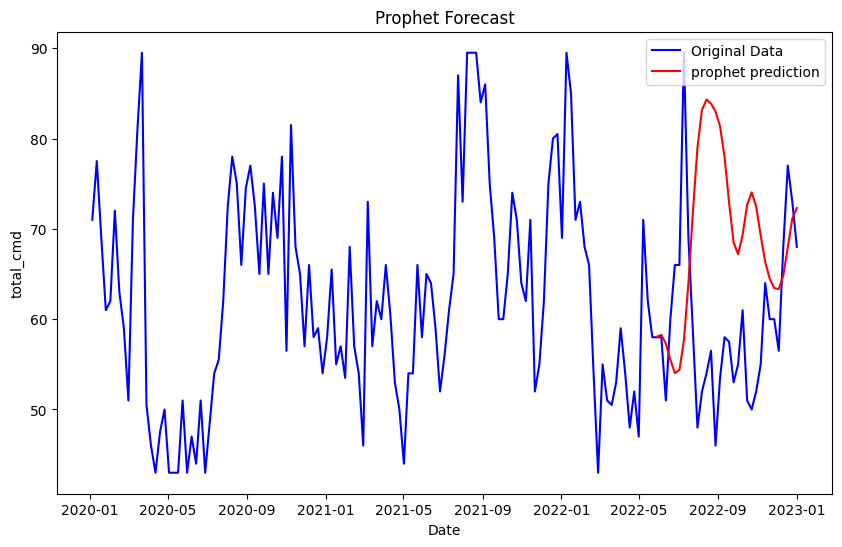

In [99]:
plt.figure(figsize=(10, 6))

plt.plot(data_Prp['ds'], data_Prp['y'], label='Original Data', color='blue')
plt.plot(test_forecast['ds'],test_forecast['yhat'], label='prophet prediction', color='red')

plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Prophet Forecast')
plt.legend(loc='upper right')
plt.show()

### MSE

In [100]:
from sklearn.metrics import mean_squared_error
MSE_PROPHET= mean_squared_error(testP_data['y'], test_forecast['yhat'])
MSE['MSE_PROPHET']=MSE_PROPHET
print('Mean Squared Error:', MSE_PROPHET)

Mean Squared Error: 320.80838137581964


### Prediction for the next 4 Weeks

In [127]:
from prophet import Prophet
from prophet.plot import plot_plotly
my_model = Prophet(interval_width=0.95,changepoint_prior_scale= 0.4,holidays_prior_scale= 0.4,
                  n_changepoints=25,seasonality_mode='additive',holidays=holiday,
                  weekly_seasonality=True,daily_seasonality = True,yearly_seasonality = True)
my_model.fit(data_Prp)
future_dates = my_model.make_future_dataframe(periods=4, freq='w')
forecast_future = my_model.predict(future_dates)
forecast_future.tail()

DEBUG:cmdstanpy:input tempfile: /tmp/tmps47ga8a7/s7ztixy_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps47ga8a7/17w_hvf9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85663', 'data', 'file=/tmp/tmps47ga8a7/s7ztixy_.json', 'init=/tmp/tmps47ga8a7/17w_hvf9.json', 'output', 'file=/tmp/tmps47ga8a7/prophet_modelmxu1hqo_/prophet_model-20230831172412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:24:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:24:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Eid al-Adha* (*estimated),Eid al-Adha* (*estimated)_lower,Eid al-Adha* (*estimated)_upper,Eid al-Fitr* (*estimated),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
156,2023-01-01,59.605305,51.038647,84.612198,59.605305,59.605305,0.0,0.0,0.0,0.0,...,-2.246955,-2.246955,-2.246955,10.180867,10.180867,10.180867,0.0,0.0,0.0,67.730479
157,2023-01-08,59.401975,44.232705,77.540061,59.385436,59.419541,0.0,0.0,0.0,0.0,...,-2.246955,-2.246955,-2.246955,7.290090,7.290090,7.290090,0.0,0.0,0.0,61.449170
158,2023-01-15,59.198646,43.047099,74.110203,59.141281,59.260802,0.0,0.0,0.0,0.0,...,-2.246955,-2.246955,-2.246955,4.664127,4.664127,4.664127,0.0,0.0,0.0,58.619878
159,2023-01-22,58.995316,40.099940,74.078214,58.881056,59.123867,0.0,0.0,0.0,0.0,...,-2.246955,-2.246955,-2.246955,3.932298,3.932298,3.932298,0.0,0.0,0.0,57.684719
160,2023-01-29,58.791987,42.043482,73.579474,58.604434,58.996826,0.0,0.0,0.0,0.0,...,-2.246955,-2.246955,-2.246955,4.065645,4.065645,4.065645,0.0,0.0,0.0,57.614736


In [144]:
prohet_prediction=forecast_future[['ds', 'yhat']].tail(5)
prohet_prediction

,ds,yhat
156,2023-01-01,67.730479
157,2023-01-08,61.449170
158,2023-01-15,58.619878
159,2023-01-22,57.684719
160,2023-01-29,57.614736


### Visualization of the prediction

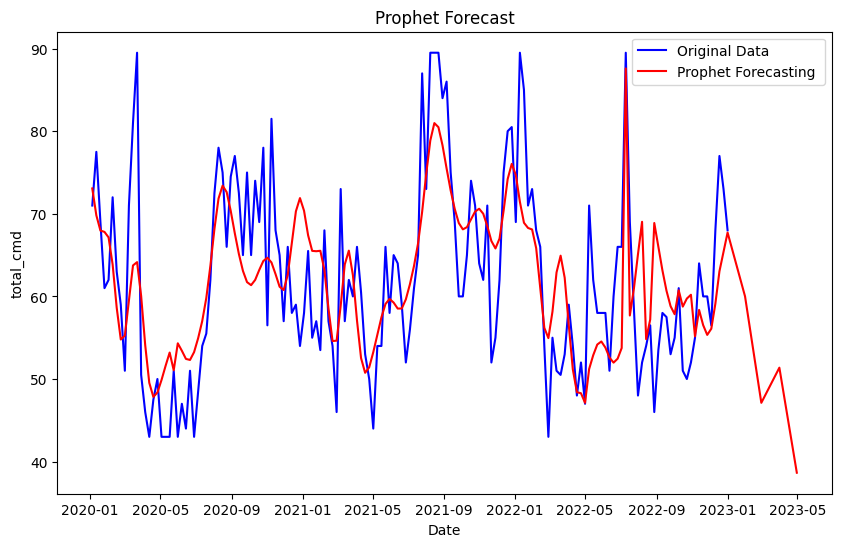

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(data_Prp['ds'], data_Prp['y'], label='Original Data', color='blue')
plt.plot(forecast_future['ds'],forecast_future['yhat'], label='Prophet Forecasting ', color='red')

plt.xlabel('Date')
plt.ylabel('total_cmd')
plt.title('Prophet Forecast')
plt.legend()
plt.show()

### Plotting Forecast Components

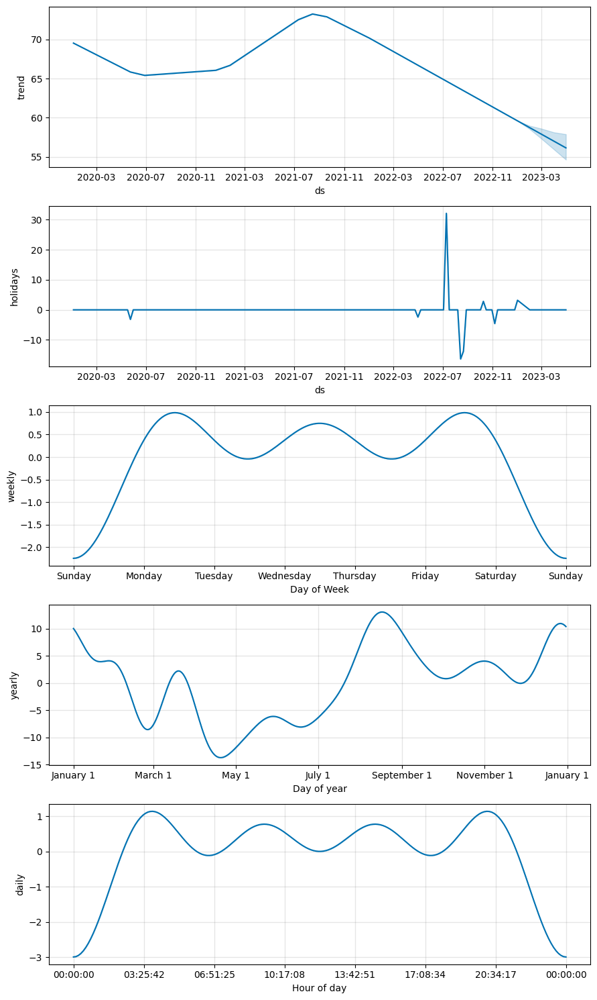

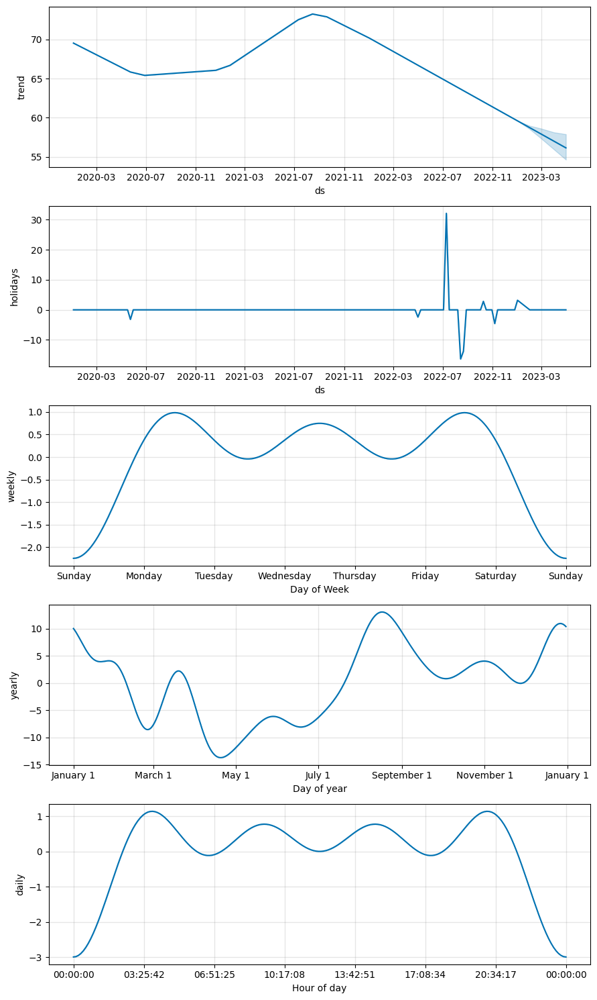

In [ ]:
my_model.plot_components(forecast_future)

## Building the LSTM Model


In [21]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
from keras.optimizers import Adam
from keras.layers import LSTM, Dense, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop

### Normalizing data


In [22]:
# Step 4: Data Scaling
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_data)
test_scaled = scaler.transform(test_data)

### Create sequence

In [25]:
# Step 5: Create Sequences

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

seq_length = 7  # Adjust as needed
X_train, y_train = create_sequences(train_scaled, seq_length)
X_test, y_test = create_sequences(test_scaled, seq_length)

### Build LSTM model

In [ ]:
def create_lstm_model(units=32,learning_rate=0.001):
    model = Sequential()
    model.add(LSTM(units, input_shape=(X_train.shape[1], X_train.shape[2]),return_sequences=True))
    model.add(LSTM(units, dropout=0.2))
    model.add(Dense(1))
    learning_rate = learning_rate  # Choose your learning rate

    # Create an instance of the Adam optimizer with the specified learning rate
    opt = Adam(learning_rate=learning_rate)

    model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mean_squared_error'])
    return model


### Grid search

In [ ]:
model = KerasRegressor(build_fn=create_lstm_model, verbose=2)

param_grid = {
    'units': [32, 64, 128],              # Number of LSTM units in each layer
    'batch_size': [32, 64],              # Number of samples per gradient update
    'epochs': [50, 100],                 # Number of training epochs
    'learning_rate': [0.001, 0.01],      # Learning rate for the optimizer
    'validation_split': [0.1, 0.2],
}
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3)

<ipython-input-43-bd1810f57223>:1: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasRegressor(build_fn=create_lstm_model, verbose=2)


### Fit grid search

In [ ]:
grid_result = grid.fit(X_train, y_train)
grid_result

Epoch 1/50
3/3 - 6s - loss: 0.2964 - mean_squared_error: 0.2964 - val_loss: 0.0946 - val_mean_squared_error: 0.0946 - 6s/epoch - 2s/step
Epoch 2/50
3/3 - 0s - loss: 0.2376 - mean_squared_error: 0.2376 - val_loss: 0.0732 - val_mean_squared_error: 0.0732 - 61ms/epoch - 20ms/step
Epoch 3/50
3/3 - 0s - loss: 0.1877 - mean_squared_error: 0.1877 - val_loss: 0.0548 - val_mean_squared_error: 0.0548 - 63ms/epoch - 21ms/step
Epoch 4/50
3/3 - 0s - loss: 0.1406 - mean_squared_error: 0.1406 - val_loss: 0.0396 - val_mean_squared_error: 0.0396 - 59ms/epoch - 20ms/step
Epoch 5/50
3/3 - 0s - loss: 0.1027 - mean_squared_error: 0.1027 - val_loss: 0.0288 - val_mean_squared_error: 0.0288 - 74ms/epoch - 25ms/step
Epoch 6/50
3/3 - 0s - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.0244 - val_mean_squared_error: 0.0244 - 78ms/epoch - 26ms/step
Epoch 7/50
3/3 - 0s - loss: 0.0609 - mean_squared_error: 0.0609 - val_loss: 0.0277 - val_mean_squared_error: 0.0277 - 59ms/epoch - 20ms/step
Epoch 8/50
3/3 - 

2/2 - 1s - 807ms/epoch - 403ms/step
Epoch 1/50
2/2 - 6s - loss: 0.2835 - mean_squared_error: 0.2835 - val_loss: 0.0820 - val_mean_squared_error: 0.0820 - 6s/epoch - 3s/step
Epoch 2/50
2/2 - 0s - loss: 0.2475 - mean_squared_error: 0.2475 - val_loss: 0.0654 - val_mean_squared_error: 0.0654 - 77ms/epoch - 39ms/step
Epoch 3/50
2/2 - 0s - loss: 0.2107 - mean_squared_error: 0.2107 - val_loss: 0.0514 - val_mean_squared_error: 0.0514 - 69ms/epoch - 34ms/step
Epoch 4/50
2/2 - 0s - loss: 0.1791 - mean_squared_error: 0.1791 - val_loss: 0.0402 - val_mean_squared_error: 0.0402 - 81ms/epoch - 40ms/step
Epoch 5/50
2/2 - 0s - loss: 0.1471 - mean_squared_error: 0.1471 - val_loss: 0.0324 - val_mean_squared_error: 0.0324 - 88ms/epoch - 44ms/step
Epoch 6/50
2/2 - 0s - loss: 0.1176 - mean_squared_error: 0.1176 - val_loss: 0.0292 - val_mean_squared_error: 0.0292 - 80ms/epoch - 40ms/step
Epoch 7/50
2/2 - 0s - loss: 0.0936 - mean_squared_error: 0.0936 - val_loss: 0.0325 - val_mean_squared_error: 0.0325 - 65ms

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
1/1 - 0s - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0870 - val_mean_squared_error: 0.0870 - 82ms/epoch - 82ms/step
Epoch 64/100
1/1 - 0s - loss: 0.0505 - mean_squared_error: 0.0505 - val_loss: 0.0870 - val_mean_squared_error: 0.0870 - 90ms/epoch - 90ms/step
Epoch 65/100
1/1 - 0s - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.0872 - val_mean_squared_error: 0.0872 - 69ms/epoch - 69ms/step
Epoch 66/100
1/1 - 0s - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0875 - val_mean_squared_error: 0.0875 - 72ms/epoch - 72ms/step
Epoch 67/100
1/1 - 0s - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0878 - val_mean_squared_error: 0.0878 - 75ms/epoch - 75ms/step
Epoch 68/100
1/1 - 0s - loss: 0.0487 - mean_squared_error: 0.0487 - val_loss: 0.0883 - val_mean_squared_error: 0.0883 - 78ms/epoch - 78ms/step
Epoch 69/100
1/1 - 0s - loss: 0.0488 - mean_squared_error: 0.0488 - val_loss:

GridSearchCV(cv=3,
             estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x7a4833173100>,
             param_grid={'batch_size': [32, 64], 'epochs': [50, 100],
                         'learning_rate': [0.001, 0.01], 'units': [32, 64, 128],
                         'validation_split': [0.1, 0.2]},
             scoring='neg_mean_squared_error')

### Best parameter

In [ ]:
grid_result.best_params_

{'batch_size': 64,
 'epochs': 50,
 'learning_rate': 0.01,
 'units': 128,
 'validation_split': 0.2}

### Get Best Model and Predict

In [27]:
best_model = grid_result.best_estimator_.model
prediction_LSTM = best_model.predict(X_test)
prediction_LSTM

1/1 [==============================] - 1s 1s/step


array([[0.79118574],
       [0.67346007],
       [0.47439986],
       [0.27500442],
       [0.23890972],
       [0.2569033 ],
       [0.30013838],
       [0.24667531],
       [0.27561915],
       [0.33817115],
       [0.36732888],
       [0.3370779 ],
       [0.33532953],
       [0.39443162],
       [0.32635936],
       [0.27681264],
       [0.27319828],
       [0.3036362 ],
       [0.40752953],
       [0.4302004 ],
       [0.43633333],
       [0.39532062],
       [0.48484057],
       [0.63413805],
       [0.65483856]], dtype=float32)

### Visualization of the test prediction

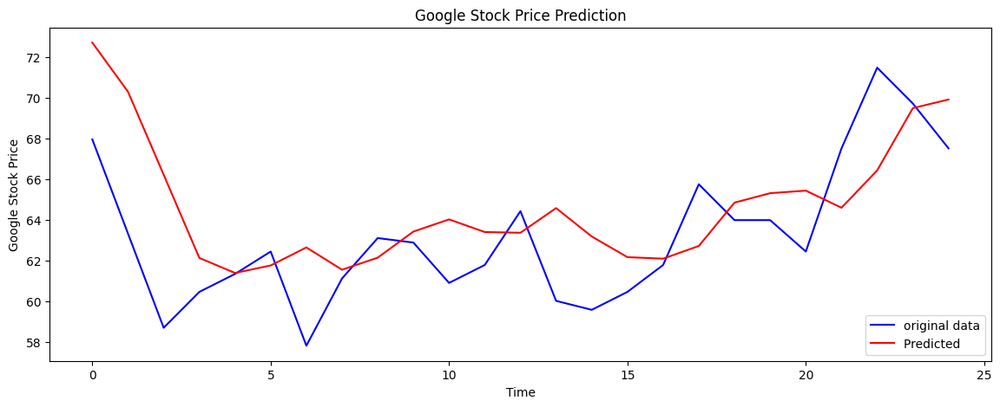

In [107]:
prediction_LSTM = scaler.inverse_transform(np.array(prediction_LSTM).reshape(-1, 1))
y_test = scaler.inverse_transform(np.array(y_test).reshape(-1, 1))

plt.figure(figsize=(14,5))
plt.plot(y_test, color = 'blue', label = 'original data')
plt.plot(prediction_LSTM, color = 'red', label = 'Predicted ')
plt.title('Google Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Google Stock Price')
plt.legend()
plt.show()

### Save model

In [ ]:
best_model.save('lstm_model_v2.h5')


In [23]:
from keras.models import load_model

loaded_model = load_model('lstm_model_v2.h5')

### MSE

In [29]:
from sklearn.metrics import mean_squared_error
MSE_LSTM= mean_squared_error(y_test, prediction_LSTM)
print('Mean Squared Error:', MSE_LSTM)

Mean Squared Error: 0.025373019311470242


### Different MSE for different test prediction

In [109]:
MSE=pd.DataFrame({'MSE_SARIMA':[MSE_SARIMA],
                  'MSE_ARIMA':[MSE_ARIMA],
                  'MSE_PROPHET':[MSE_PROPHET],
                  'MSE_LSTM':[MSE_LSTM]})
MSE

,MSE_SARIMA,MSE_ARIMA,MSE_PROPHET,MSE_LSTM
0,76.039543,90.797828,320.808381,10.663007


## Prediction for the next 4 Weeks

In [64]:
# Get the most recent sequence to use for prediction
last_7P=data_W['total_cmd'].tail(7)
last_7P
scaler = MinMaxScaler()
latest_sequence= scaler.fit_transform(last_7P.values.reshape(-1,1))

# Reshape and scale the sequence
# latest_sequence = scaler.fit_transform(latest_sequence.reshape(1, -1))

# Predict the next 4 weeks
future_predictions = []
for _ in range(5):
    next_prediction = loaded_model.predict(latest_sequence.reshape(1,-1))
    future_predictions.append(next_prediction[0, 0])
    latest_sequence[1:]  # Shift sequence by one step
    latest_sequence[-1] = next_prediction
future_predictions

1/1 [==============================] - 0s 34ms/step


[0.6747953, 0.7393656, 0.77655834, 0.79816127, 0.81076896]

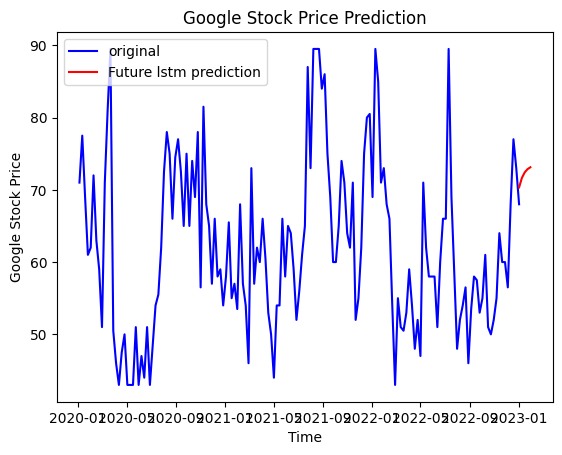

In [65]:
# Inverse transform predictions to get actual values
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions
future_dates = pd.date_range(start=data_W.index[-1], periods=5, freq='W')

plt.plot(data_W, color = 'blue', label = 'original')
plt.plot(future_dates,future_predictions, color = 'red', label = 'Future lstm prediction')


plt.title('Google Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Google Stock Price')
plt.legend()
plt.show()

# Different prediction of different models

In [145]:
data_pred['predict_LSTM']=future_predictions
data_pred

,predi_SARIMA,predict_ARIMA,predict_LSTM
date,,,
2023-01-01,69.271826,68.171539,70.333305
2023-01-08,64.131691,69.616274,71.656998
2023-01-15,62.944071,68.356535,72.419449
2023-01-22,60.315400,64.512785,72.862305
2023-01-29,60.221633,63.298318,73.120766


# ABC XYZ Segmentation

## XYZ Analysis

Install pmdarima package to use arima model

In [71]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 7.6 MB/s eta 0:00:00


In [72]:
# Define a function to calculate Mean Absolute Percentage Error (MAPE)
def MAPE(y_orig, y_pred):
    # Calculate the absolute percentage error for each data point
    abs_percentage_error = abs((y_orig - y_pred) / y_orig) * 100.
    # Calculate the mean of the absolute percentage errors
    MAPE = np.mean(abs_percentage_error)
    return MAPE

In [87]:
# Import necessary libraries
import pmdarima as pm
from pmdarima.model_selection import train_test_split
import numpy as np
import pandas as pd
# Define a function for XYZ analysis
def XYZ_analysis(df):
    # Initialize an empty list to store results
    XYZ_list = []

    # Iterate through groups in the DataFrame based on 'c_produit' column
    for group, value in df.groupby(['c_produit']):
        # Select relevant columns, set 'date' as the index
        grouped_df = (
            value.loc[:, ['date', 'total_cmd']].set_index('date')
        )

        # Split the data into training and testing sets
        train, test = train_test_split(grouped_df, train_size=18)

        # Fit a seasonal ARIMA model to the training data
        model = pm.auto_arima(train, seasonal=True)

        # Make forecasts for the test data
        forecasts = model.predict(test.shape[0])  # predict N steps into the future

        # Calculate MAPE between the test data and forecasts
        mape = MAPE(test.values.reshape(1, -1)[0], forecasts)

        # Append product group and its corresponding MAPE to the list
        XYZ_list.append([group, mape])

    # Create a DataFrame from the list with columns 'c_produit' and 'MAPE'
    XYZ_group = pd.DataFrame(XYZ_list, columns=['c_produit', 'MAPE'])

    # Sort the DataFrame by 'MAPE' in ascending order
    XYZ_group = XYZ_group.sort_values(by=['MAPE'], ascending=True)

    # Add additional columns for ranking and forecastability classification
    XYZ_group["Rank"] = XYZ_group['MAPE'].rank(ascending=True)
    XYZ_group["Forecastability"] = ' '

    # Categorize products into classes X, Y, and Z based on forecastability
    XYZ_group['Forecastability'][0: int(0.2 * XYZ_group['Rank'].max())] = 'X'
    XYZ_group['Forecastability'][int(0.2 * XYZ_group['Rank'].max()): int(0.5 * XYZ_group['Rank'].max())] = 'Y'
    XYZ_group['Forecastability'][int(0.5 * XYZ_group['Rank'].max()):] = 'Z'

    return XYZ_group

# Call the XYZ_analysis function with a DataFrame 'df' and store the result in 'XYZ_groups'
XYZ_groups = XYZ_analysis(df)
XYZ_groups

<ipython-input-87-9ff248b538cc>:9: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for group, value in df.groupby(['c_produit']):
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `sta

,c_produit,MAPE,Rank,Forecastability
38,785959,23.193096,1.0,X
69,806851,24.093567,2.0,X
100,902484,26.296174,3.0,X
86,900995,27.588851,4.0,X
104,902872,27.854663,5.0,X
...,...,...,...,...
23,121420,1028.694342,116.0,Z
33,781150,1199.937548,117.0,Z
20,118445,1923.047107,118.0,Z
107,903155,5534.804979,119.0,Z


In [88]:
XYZ_groups=XYZ_groups.sort_values('c_produit',ascending=True)
XYZ_groups

,c_produit,MAPE,Rank,Forecastability
0,100140,624.617738,108.0,Z
1,100271,595.383759,106.0,Z
2,100950,220.124640,73.0,Z
3,100977,594.311676,105.0,Z
4,101615,322.254654,87.0,Z
...,...,...,...,...
115,903580,41.906761,29.0,Y
116,903618,191.142014,70.0,Z
117,903820,98.688314,63.0,Z
118,903822,56.638714,41.0,Y


## ABC Analysis

In [89]:
import pymannkendall as mk
import pandas as pd

ABC_list = pd.DataFrame(columns=['product', 'trend_type'])

grouped_df = df.groupby('c_produit')

for product, data in grouped_df:
    trend = mk.seasonal_test(data['total_cmd'], period=7)

    if trend[0] == 'no trend':
        trend_type = 'A'
    elif trend[0] == 'increasing':
        trend_type = 'B'
    else:
        trend_type = 'C'

    # Add a new row to the DataFrame using .loc
    ABC_list.loc[len(ABC_list)] = [product, trend_type]

# Print the resulting DataFrame
print(ABC_list)


     product trend_type
0     100140          B
1     100271          A
2     100950          B
3     100977          A
4     101615          A
..       ...        ...
115   903580          A
116   903618          A
117   903820          A
118   903822          A
119   904077          A

[120 rows x 2 columns]


## ABC-XYZ Analysis

In [90]:
grouped_ABC_XYZ=ABC_list.copy()
grouped_ABC_XYZ['Forecastability']=XYZ_groups['Forecastability']

<Axes: xlabel='Forecastability', ylabel='trend_type'>

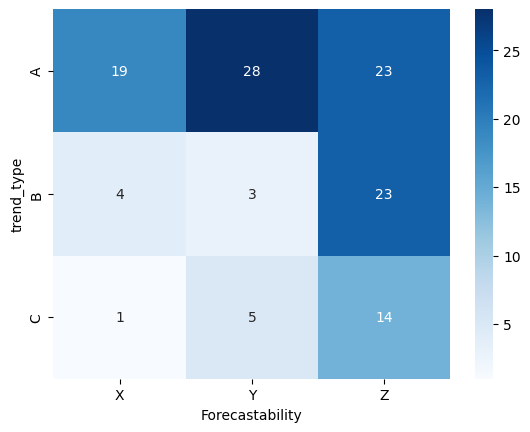

In [91]:
grouped_ABC_XYZ = grouped_ABC_XYZ.groupby(['trend_type', 'Forecastability']).count()
result = grouped_ABC_XYZ.pivot_table(index = 'trend_type', columns= 'Forecastability', values= 'product')
sns.heatmap(result, annot = True, fmt = '', cmap = 'Blues')